<a href="https://colab.research.google.com/github/bardiaHSZD/Algorithms_DataStructure/blob/main/Leetcode_Problems_Set_VI_Trees_and_Graphs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###**1. Introduction**

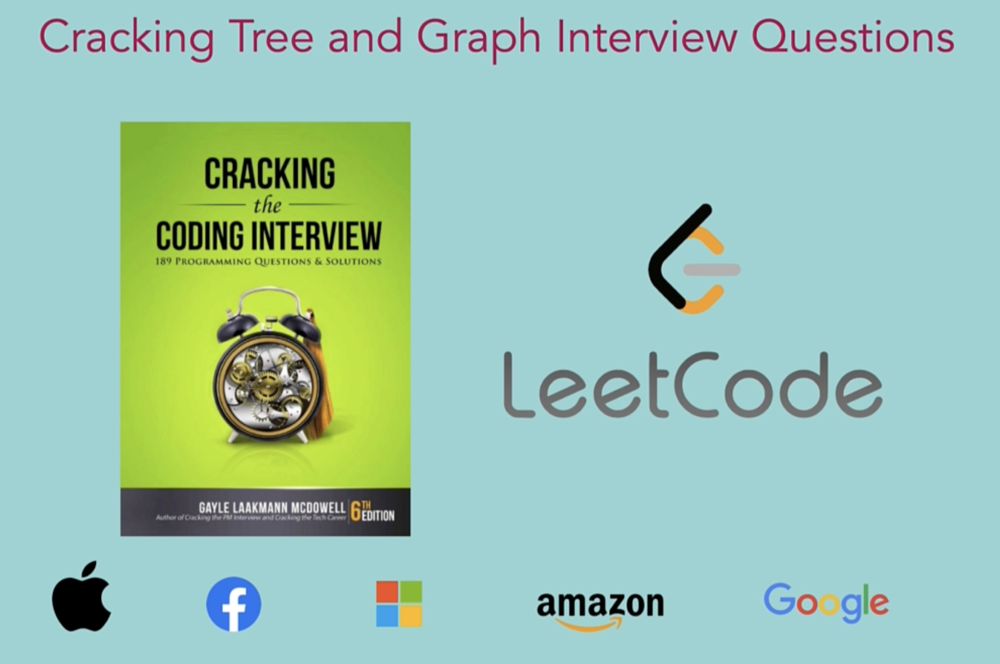

###**2. Route Between Nodes**

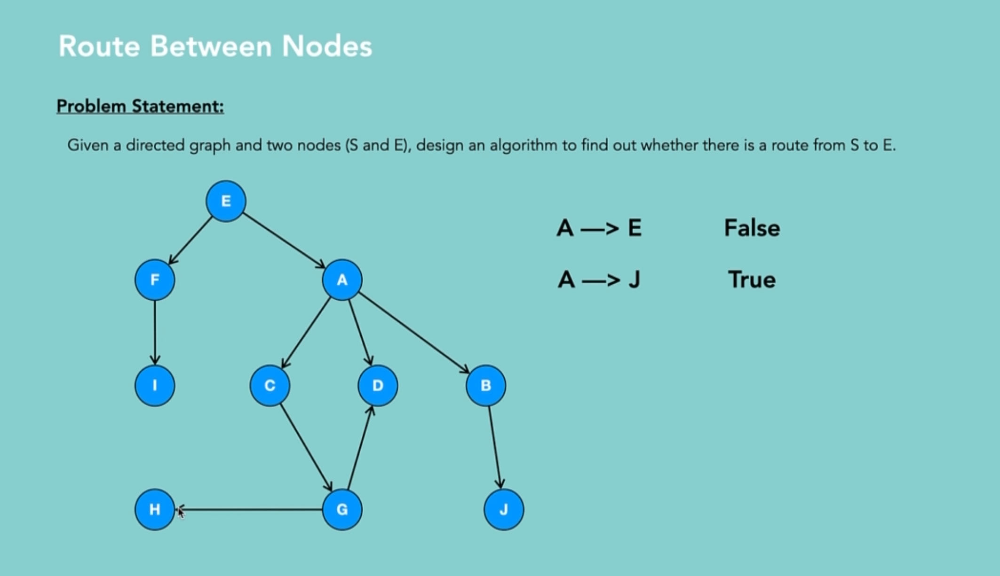

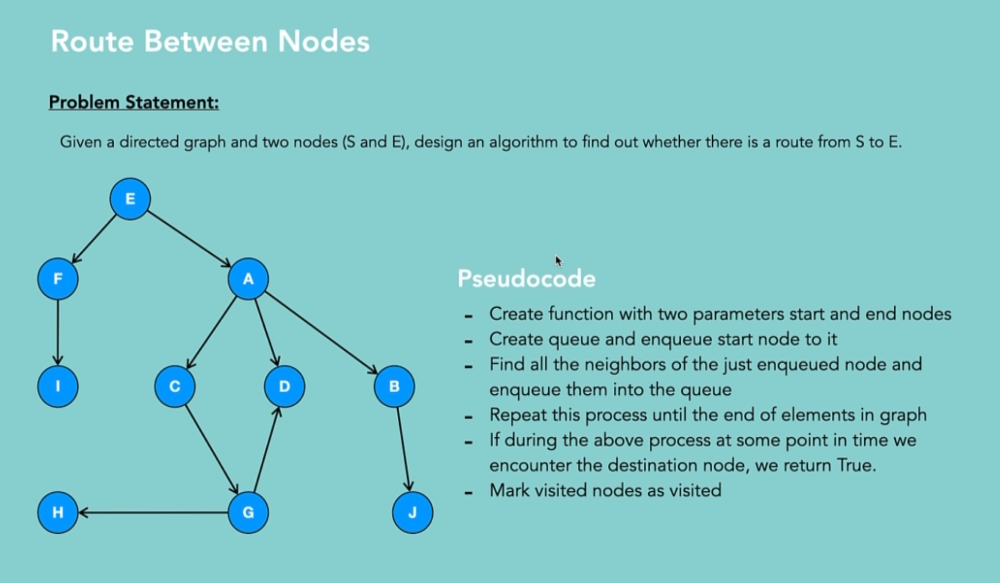

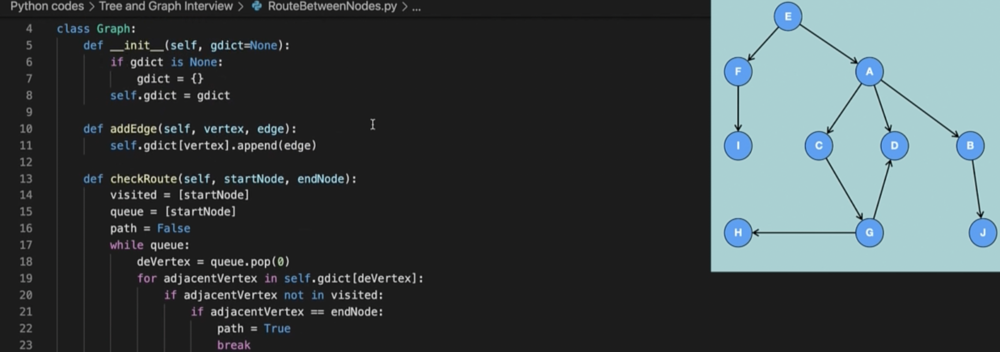

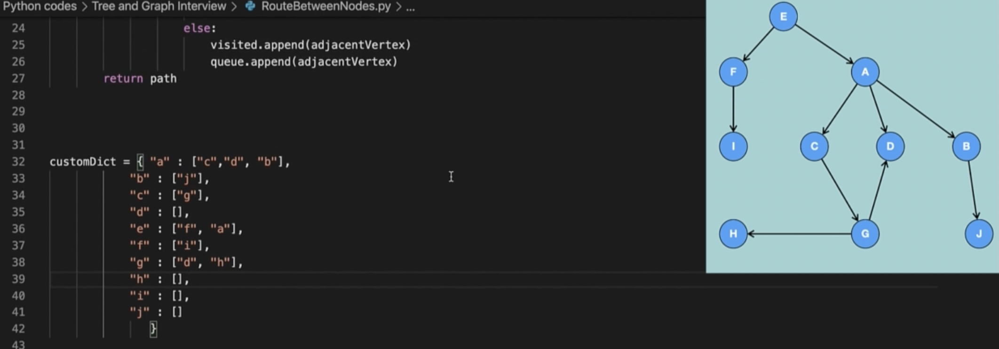

In [ ]:
class Graph:
  def __init__(self,gdict=None):
    if gdict is None:
      self.gdict = {}
    self.gdict = gdict
  def addEdge(self,vertex,edge):
    self.gdict[vertex].append(edge)

  def checkRoute(self, startNode, endNode):
    visited = [startNode]
    path = False
    queue = [startNode]
    while queue:
      deVertex = queue.pop(0)
      for adjacentVertex in self.gdict[deVertex]:
        if adjacentVertex not in visited:
          if adjacentVertex == endNode:
            path = True
            break
          else:
            visited.append(adjacentVertex)
            queue.append(adjacentVertex)
    return path

customDict = {"a": ["c", "d", "b"],
              "b": ["j"],
              "c": ["g"],
              "d": [],
              "e": ["a", "f"],
              "f": ["i"],
              "g": ["d", "h"],
              "h": [],
              "i": [],
              "j": [],
}

customGraph = Graph(customDict)
print(customGraph.checkRoute("a","g"))
print(customGraph.checkRoute("a","i"))

True
False


###**3. Minimal Tree: Leetcode Problem 108 - Convert Sorted Array to Binary Search Tree**

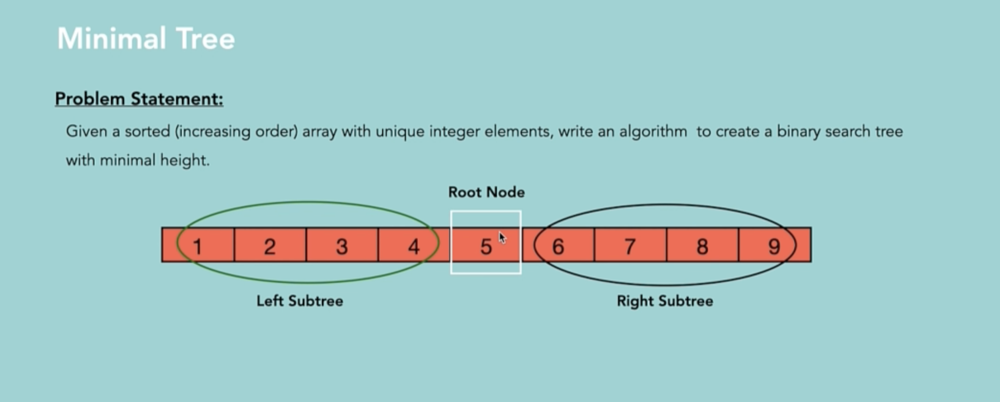

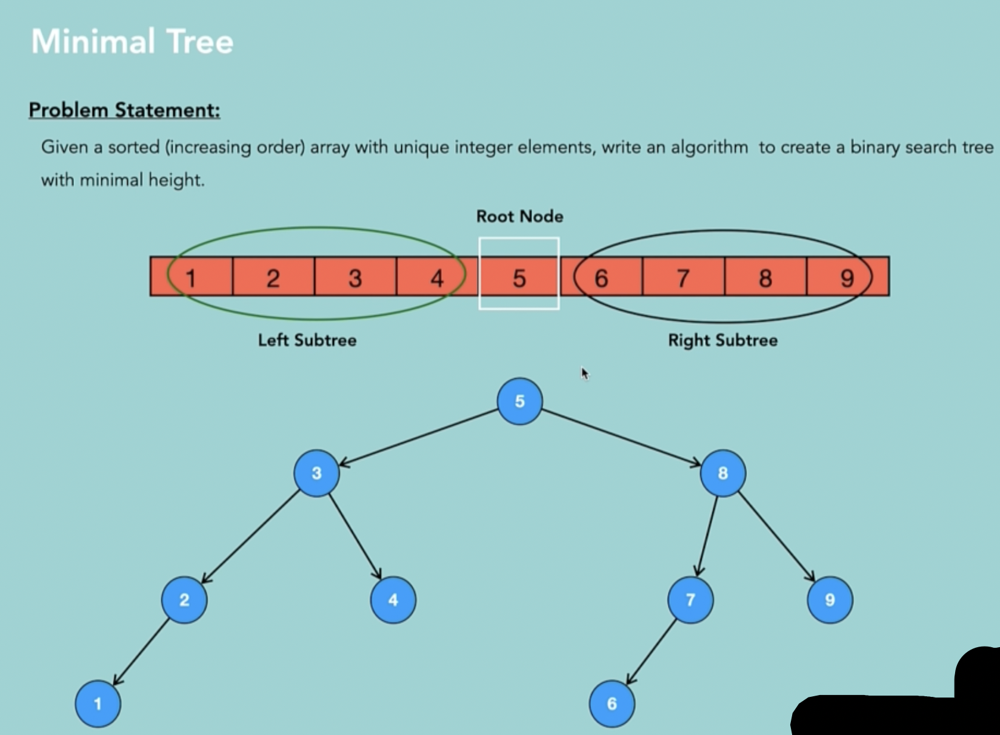

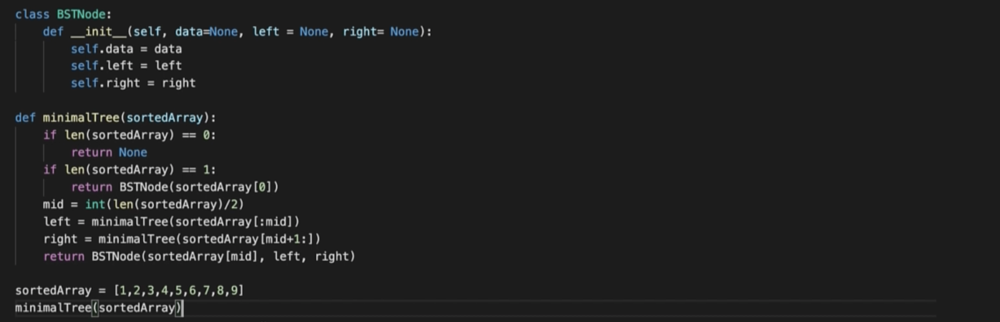

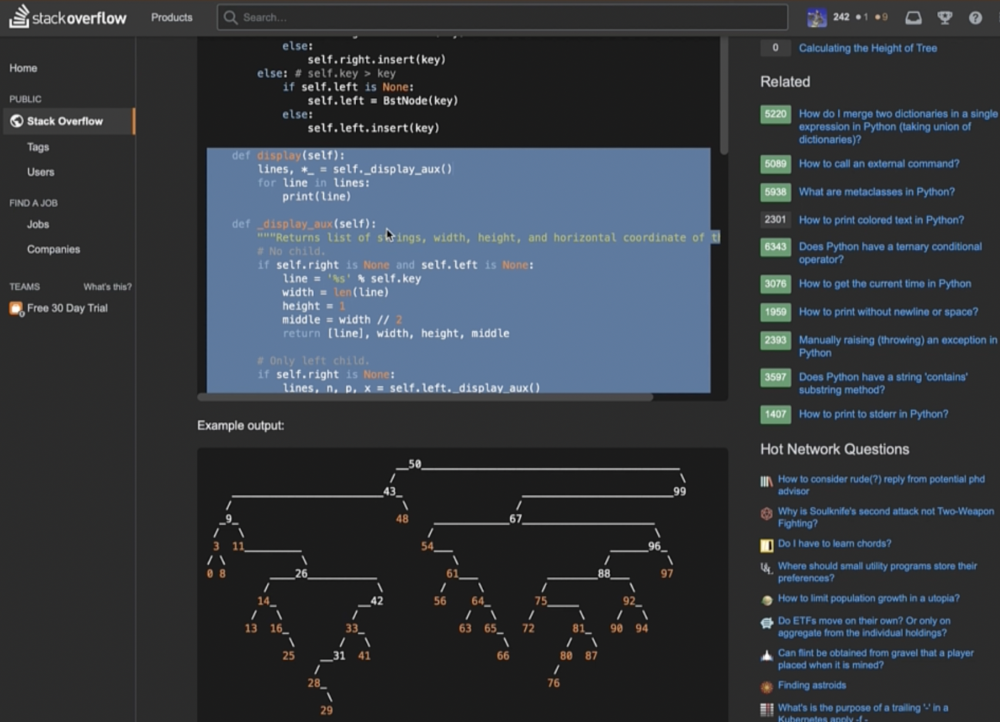

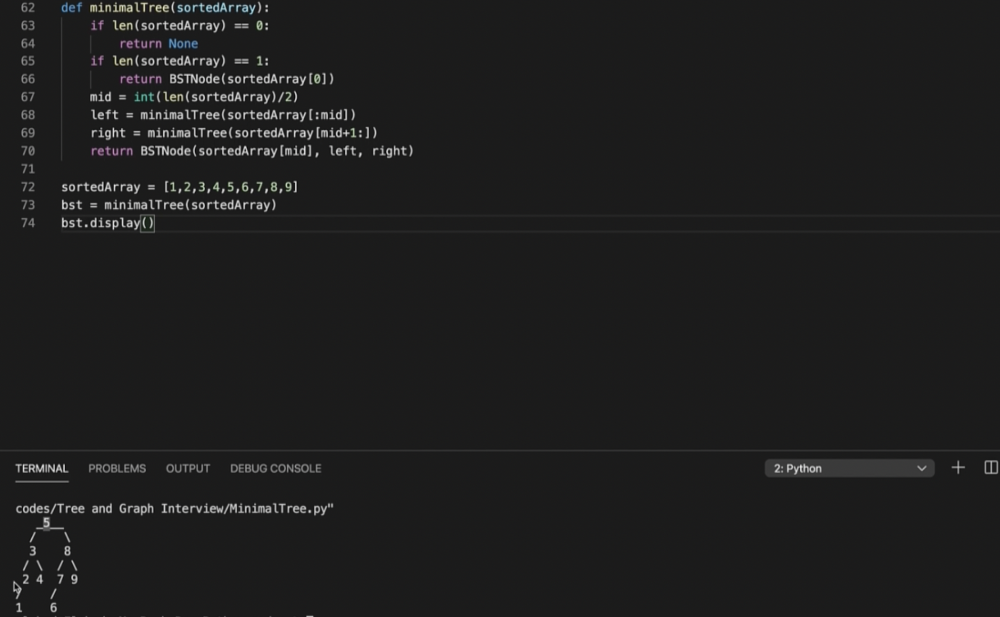

In [ ]:
class BTSNode:
    def __init__(self, data = None, left = None, right = None):
        self.data = data
        self.left = left
        self.right = right

    def display(self):
        lines, *_ = self._display_aux()
        for line in lines:
            print(line)

    def _display_aux(self):
        """Returns list of strings, width, height, and horizontal coordinate of the root."""
        # No child.
        if self.right is None and self.left is None:
            line = '%s' % self.data
            width = len(line)
            height = 1
            middle = width // 2
            return [line], width, height, middle

        # Only left child.
        if self.right is None:
            lines, n, p, x = self.left._display_aux()
            s = '%s' % self.data
            u = len(s)
            first_line = (x + 1) * ' ' + (n - x - 1) * '_' + s
            second_line = x * ' ' + '/' + (n - x - 1 + u) * ' '
            shifted_lines = [line + u * ' ' for line in lines]
            return [first_line, second_line] + shifted_lines, n + u, p + 2, n + u // 2

        # Only right child.
        if self.left is None:
            lines, n, p, x = self.right._display_aux()
            s = '%s' % self.data
            u = len(s)
            first_line = s + x * '_' + (n - x) * ' '
            second_line = (u + x) * ' ' + '\\' + (n - x - 1) * ' '
            shifted_lines = [u * ' ' + line for line in lines]
            return [first_line, second_line] + shifted_lines, n + u, p + 2, u // 2

        # Two children.
        left, n, p, x = self.left._display_aux()
        right, m, q, y = self.right._display_aux()
        s = '%s' % self.data
        u = len(s)
        first_line = (x + 1) * ' ' + (n - x - 1) * '_' + s + y * '_' + (m - y) * ' '
        second_line = x * ' ' + '/' + (n - x - 1 + u + y) * ' ' + '\\' + (m - y - 1) * ' '
        if p < q:
            left += [n * ' '] * (q - p)
        elif q < p:
            right += [m * ' '] * (p - q)
        zipped_lines = zip(left, right)
        lines = [first_line, second_line] + [a + u * ' ' + b for a, b in zipped_lines]
        return lines, n + m + u, max(p, q) + 2, n + u // 2  

def minimalTree(sortedArray):
  if len(sortedArray) == 0:
    return None
  if len(sortedArray) == 1: 
    return BTSNode(sortedArray[0])
  mid = int(len(sortedArray)/2)  
  left = minimalTree(sortedArray[:mid])
  right = minimalTree(sortedArray[mid+1:])
  return BTSNode(sortedArray[mid],left,right)

sortedArray = [1,2,3,4,5,6,7,8,9]
bts = minimalTree(sortedArray)
bts.display()

   _5__  
  /    \ 
  3    8 
 / \  / \
 2 4  7 9
/    /   
1    6   


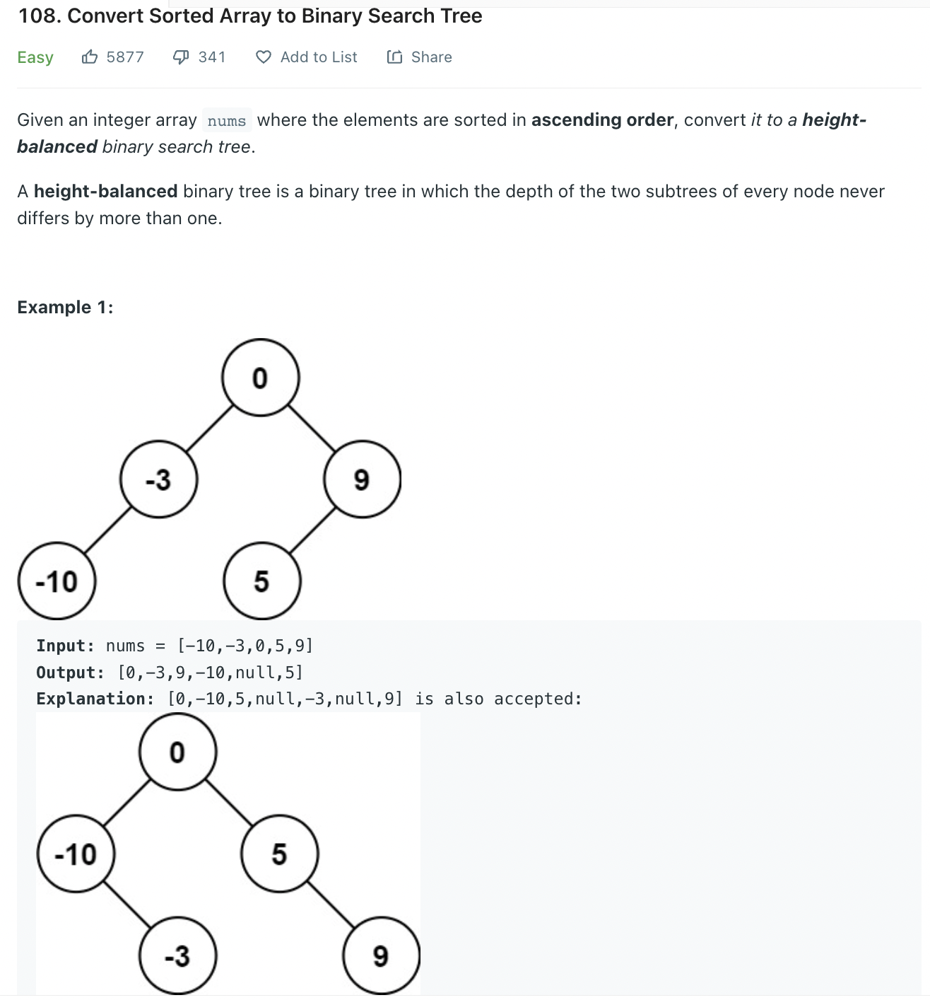

In [ ]:
# Definition for a binary tree node.
class TreeNode(object):
     def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right
        
        
class Solution(object):
    def sortedArrayToBST(self, nums):
        """
        :type nums: List[int]
        :rtype: TreeNode
        """
        
        def minimalTree(sortedArray):
            if len(sortedArray) == 0:
                return None
            if len(sortedArray) == 1: 
                return TreeNode(sortedArray[0])
            mid = int(len(sortedArray)/2)  
            return TreeNode(val = sortedArray[mid], left = minimalTree(sortedArray[:mid]), right=minimalTree(sortedArray[mid+1:]))

        return minimalTree(nums)

###**4. List of Depths: Leetcode Problem 114 - Flatten Binary Tree to Linked List**

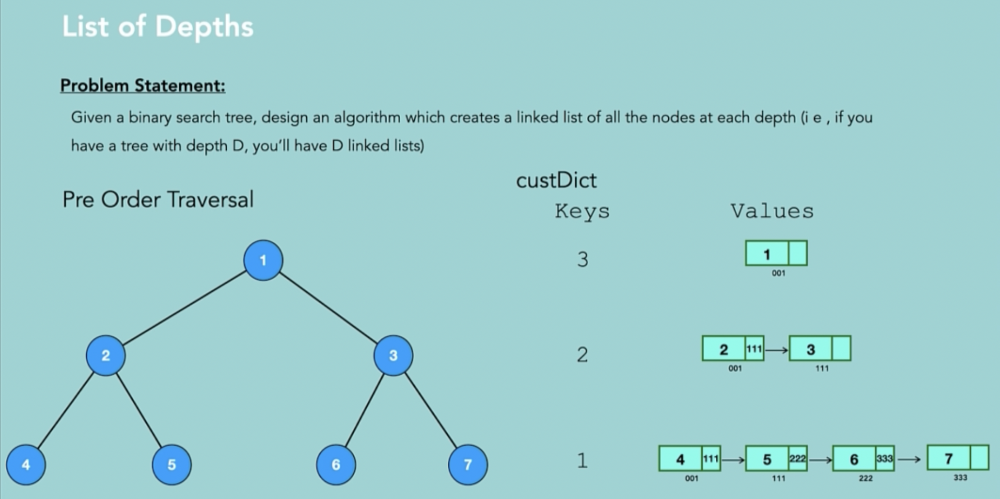

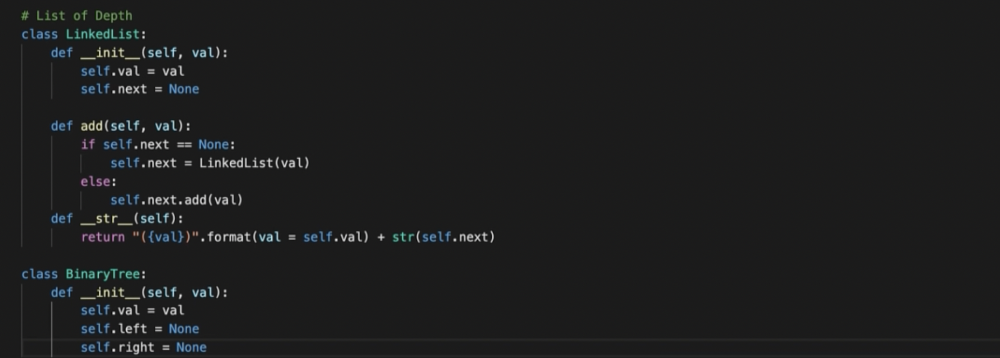

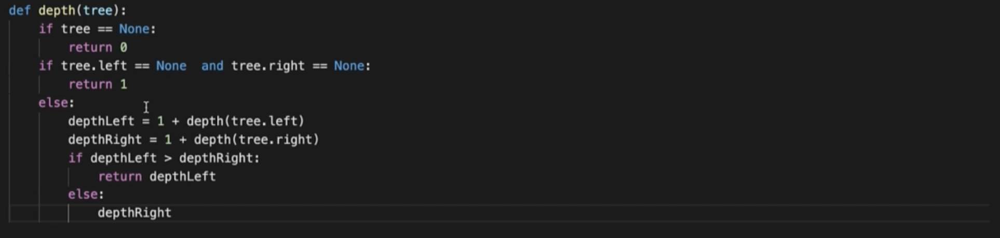

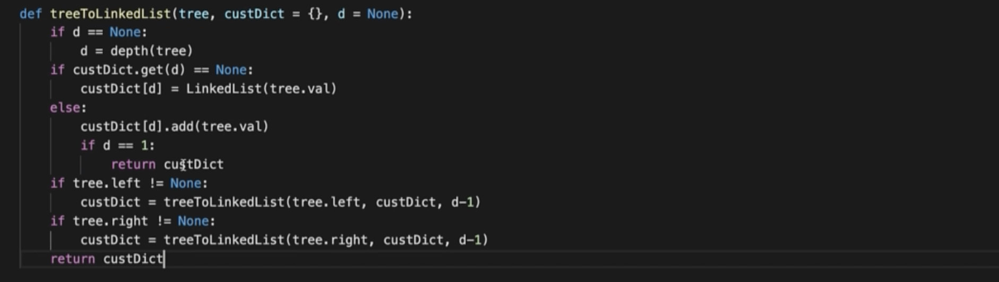

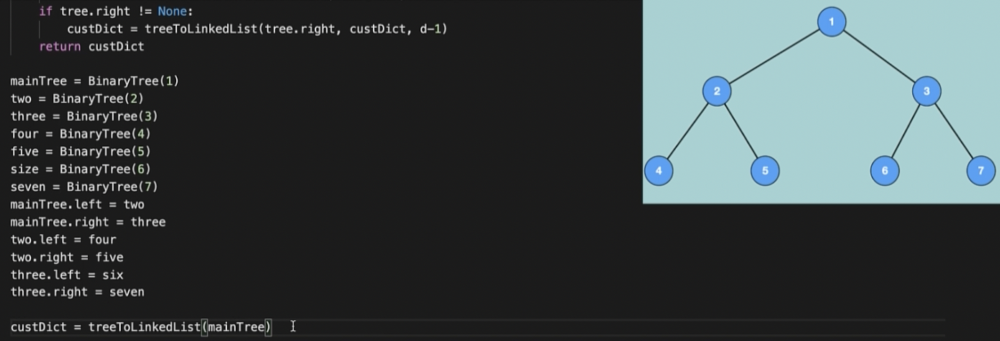

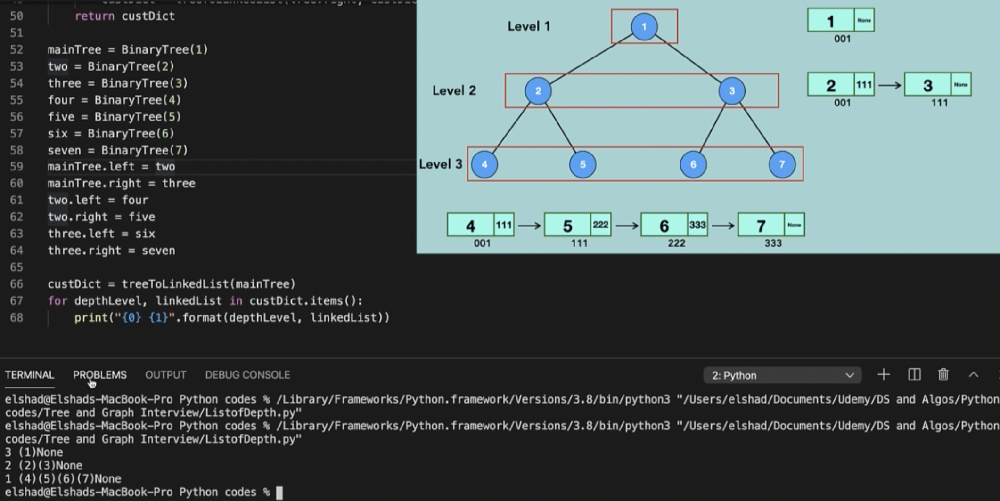

In [21]:
class LinkedList:
  def __init__(self, val):
    self.val = val
    self.next = None

  def add(self,val):
    if self.next == None:
      self.next = LinkedList(val)
    else:
      self.next.add(val)  
  
  def __str__(self):
      return "({val})".format(val = self.val) + str(self.next)

class BinaryTree:
  def __init__(self, val):
    self.val = val
    self.left = None 
    self.right = None

def depth(tree):
  if tree == None:
    return 0
  if tree.left == None and tree.right==None :
    return 1
  else:
    depthLeft = 1 + depth(tree.left)   
    depthRight = 1 + depth(tree.right)  
    if depthLeft>depthRight:
      return depthLeft
    else:
      return depthRight   


def treeToLinkedList(tree, customDict={}, d=None):
  if d == None:
    d = depth(tree)
  if customDict.get(d) == None:
    customDict[d] = LinkedList(tree.val)
  else:
    customDict[d].add(tree.val)
    if d==1:
      return customDict
  if tree.left != None:
    customDict = treeToLinkedList(tree.left, customDict, d-1)
  if tree.right != None:
    customDict = treeToLinkedList(tree.right, customDict, d-1)
  
  return customDict

mainTree = BinaryTree(1)
two = BinaryTree(2)
three = BinaryTree(3)
four = BinaryTree(4)
five = BinaryTree(5)
six = BinaryTree(6)
seven = BinaryTree(7)

mainTree.left = two
mainTree.right = three
two.left = four
two.right = five
three.left = six
three.right = seven


customDict = treeToLinkedList(mainTree)
print(customDict[3])
print(customDict[2])
print(customDict[1])


(1)None
(2)(3)None
(4)(5)(6)(7)None


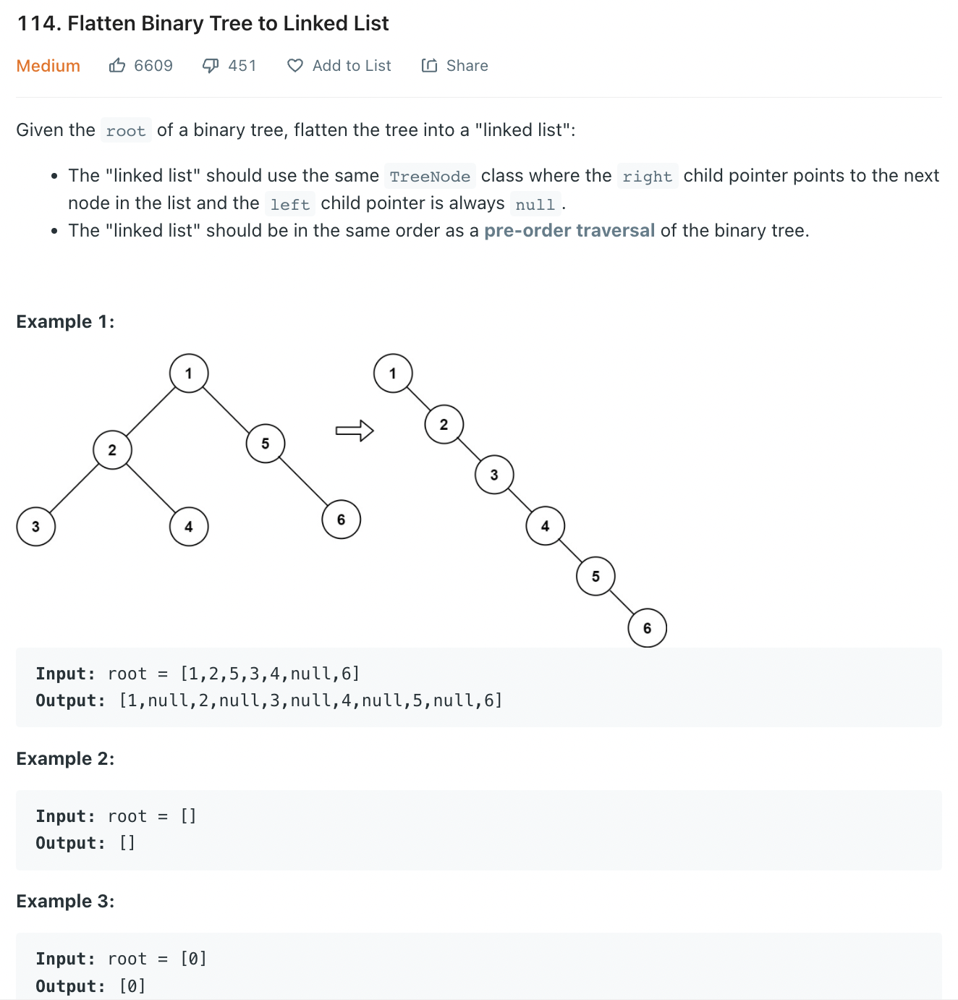

In [ ]:
# Definition for a binary tree node.
class TreeNode(object):
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right
class Solution:
    def flatten(self, root):
        '''
        1. flatten left subtree
        2. find left subtree's tail
        3. set root's left to None, root's right to root'left, tail's right to root.right
        4. flatten the original right subtree
        '''
        # escape condition
        if not root:
            return
        right = root.right
        if root.left:
            # flatten left subtree
            self.flatten(root.left)
            # find the tail of left subtree
            tail = root.left
            while tail.right:
                tail = tail.right
            # left <-- None, right <-- left, tail's right <- right
            root.left, root.right, tail.right = None, root.left, right
        # flatten right subtree
        self.flatten(right)

###**5. Check Balanced: LeetCode Problem 110 - Balanced Binary Tree**

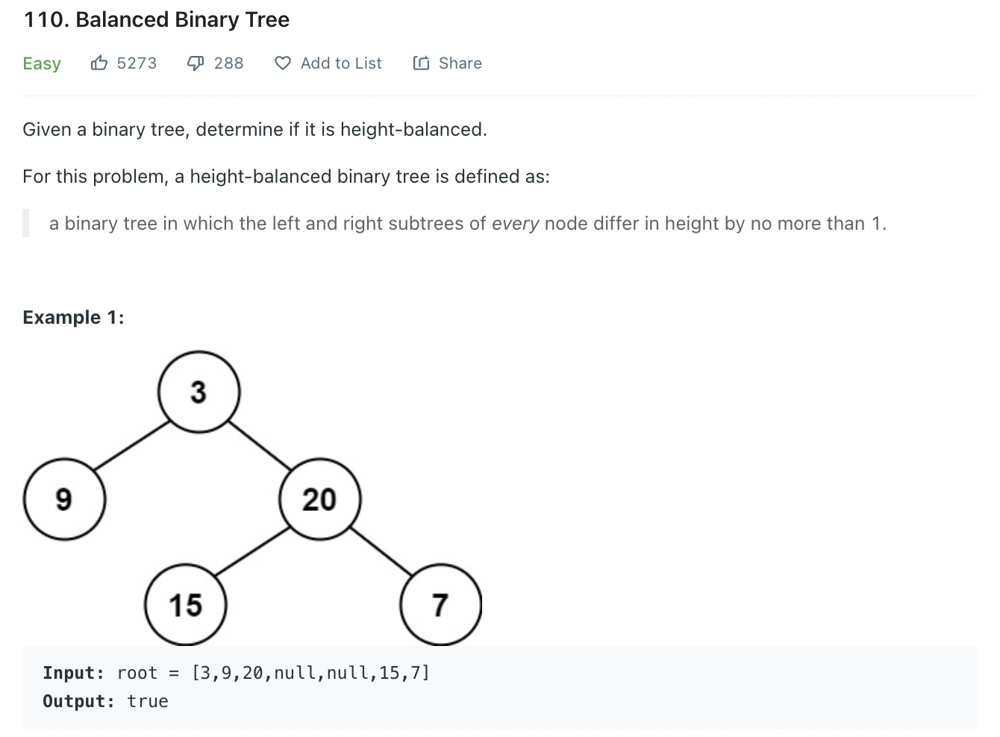

###**6. Validate BST: LeetCode Problem 98 - Validate Binary Search Tree**

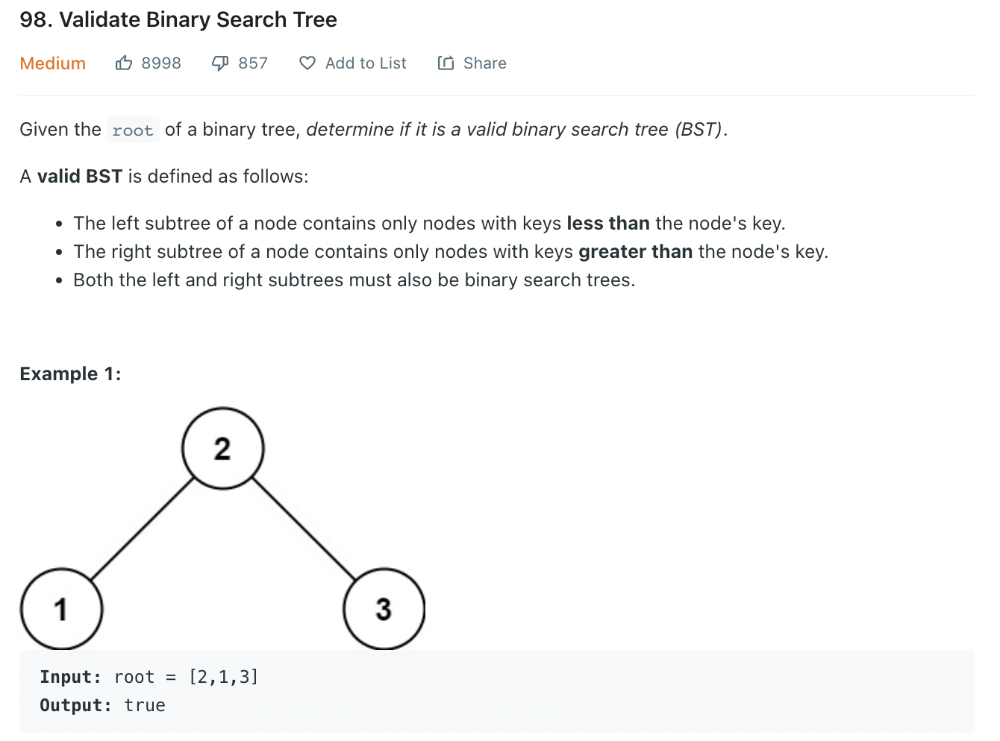

###**7. In-order Successor in BST: LeetCode Problem 285 - Inorder Successor in BST**

###**8. Build Order**

###**9. First Common Ancestor: LeetCode Problem 236 - Lowest Common Ancestor of a Binary Tree**

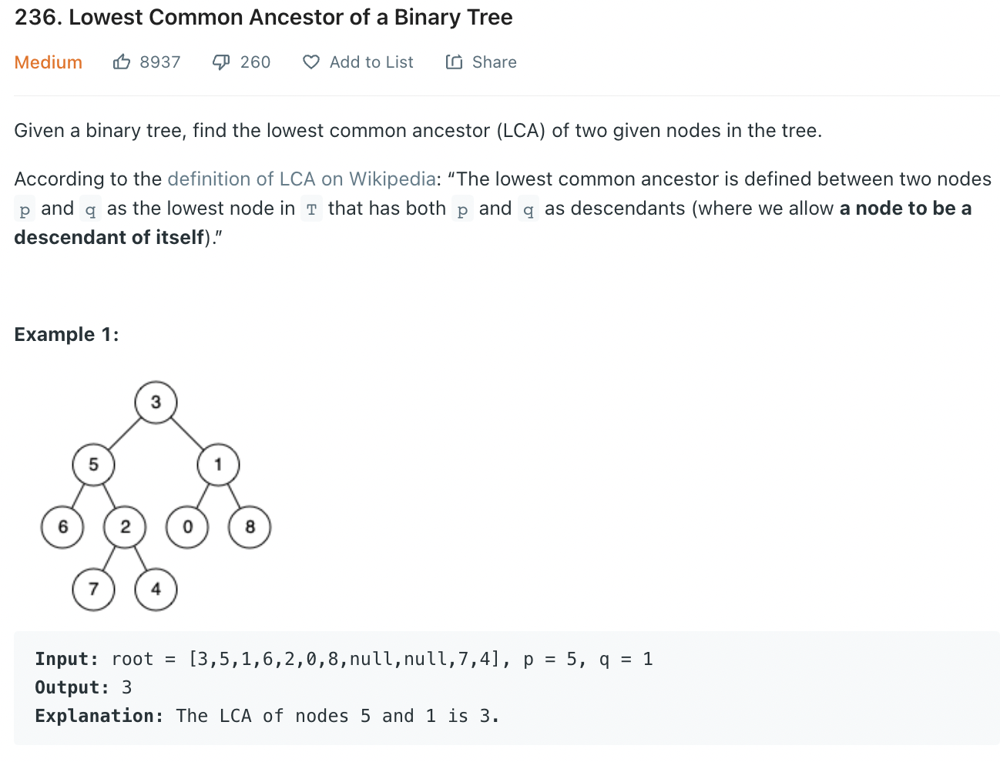